In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
from torchvision.io import read_image, ImageReadMode
from torch.utils.data import Dataset, DataLoader
import cv2
import os
import time
from copy import deepcopy
import matplotlib.pyplot as plt

print(torch.cuda.is_available())

True


In [3]:
DATA_PATH = "../../data/"
SEMANTICS_PATH = os.path.join(DATA_PATH, "data_semantics")
TRAIN_PATH = os.path.join(SEMANTICS_PATH, "training")
TRAIN_RGB_PATH = os.path.join(TRAIN_PATH, "image_2")
TRAIN_SEMANTIC_PATH = os.path.join(TRAIN_PATH, "semantic")
TEST_PATH = os.path.join(SEMANTICS_PATH, "testing")
TEST_RGB_PATH = os.path.join(TEST_PATH, "image_2")

# rgbs = sorted(os.listdir(TRAIN_RGB_PATH))
# semantics = sorted(os.listdir(TRAIN_SEMANTIC_PATH))

# print(sorted(rgbs))
# print(sorted(semantics))
# x = cv2.imread(os.path.join(TRAIN_RGB_PATH, rgbs[0]))
# plt.figure()
# plt.imshow(x)
# print(x.shape)

# x = cv2.imread(os.path.join(TRAIN_SEMANTIC_PATH, semantics[0]))
# plt.figure()
# plt.imshow(x)
# print(x.shape)

# for i in range(60):
#     x = cv2.imread(os.path.join(TRAIN_SEMANTIC_PATH, semantics[i]))
#     print(np.unique(x))

# rgbs = sorted(os.listdir(TEST_RGB_PATH))
# print(sorted(rgbs))
# x = cv2.imread(os.path.join(TEST_RGB_PATH, rgbs[0]))
# plt.figure()
# plt.imshow(x)
# print(x.shape)

In [5]:
TRAIN_INSTANCE_PATH = os.path.join(TRAIN_PATH, "instance")
instances = sorted(os.listdir(TRAIN_INSTANCE_PATH))
for i in range(60):
    x = cv2.imread(os.path.join(TRAIN_INSTANCE_PATH, instances[i]))
    print(np.unique(x))

rgbs = sorted(os.listdir(TEST_RGB_PATH))
print(sorted(rgbs))
x = cv2.imread(os.path.join(TEST_RGB_PATH, rgbs[0]))
plt.figure()
plt.imshow(x)
print(x.shape)

['000000_10.png',
 '000001_10.png',
 '000002_10.png',
 '000003_10.png',
 '000004_10.png',
 '000005_10.png',
 '000006_10.png',
 '000007_10.png',
 '000008_10.png',
 '000009_10.png',
 '000010_10.png',
 '000011_10.png',
 '000012_10.png',
 '000013_10.png',
 '000014_10.png',
 '000015_10.png',
 '000016_10.png',
 '000017_10.png',
 '000018_10.png',
 '000019_10.png',
 '000020_10.png',
 '000021_10.png',
 '000022_10.png',
 '000023_10.png',
 '000024_10.png',
 '000025_10.png',
 '000026_10.png',
 '000027_10.png',
 '000028_10.png',
 '000029_10.png',
 '000030_10.png',
 '000031_10.png',
 '000032_10.png',
 '000033_10.png',
 '000034_10.png',
 '000035_10.png',
 '000036_10.png',
 '000037_10.png',
 '000038_10.png',
 '000039_10.png',
 '000040_10.png',
 '000041_10.png',
 '000042_10.png',
 '000043_10.png',
 '000044_10.png',
 '000045_10.png',
 '000046_10.png',
 '000047_10.png',
 '000048_10.png',
 '000049_10.png',
 '000050_10.png',
 '000051_10.png',
 '000052_10.png',
 '000053_10.png',
 '000054_10.png',
 '000055_1

torch.Size([120, 480, 3])
torch.Size([120, 480])
tensor([ 0,  2,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
        20, 21, 22, 23, 24, 25, 26])


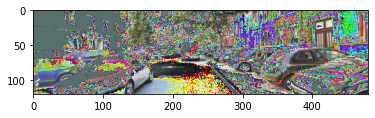

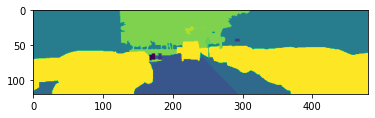

In [49]:
def read2Tensor(img_path, device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu")):
  img_t = read_image(img_path).to(torch.float32).unsqueeze(0).to(device)
  transform = transforms.Compose([transforms.Resize( (120, 480) ),
                   transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])
  img_t = transform(img_t)  
  return img_t

def pred2Img(pred):
  pred = torch.argmax(pred, dim=1).squeeze(0)
  pred = pred.to("cpu").to(torch.uint8)
  return pred

class KITTI_SEG(Dataset):
    def __init__(self, rgb_path, label_path, transform=transforms.Compose([transforms.Resize( (120, 480) ),
                                          transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))]),
                          target_transform=transforms.Compose([transforms.Resize( (120, 480) )]),
                          device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu")):
        self.rgb_path = rgb_path
        self.rgb_names = sorted(os.listdir(self.rgb_path))         
        
        self.label_path = label_path
        self.label_names = sorted(os.listdir(self.label_path))
        
        self.transform = transform
        self.target_transform = target_transform
        
        self.device = device

    def __len__(self):
        return len(self.rgb_names)

    def __getitem__(self, idx):
        img_path = os.path.join(self.rgb_path, self.rgb_names[idx])
        semantic_path = os.path.join(self.label_path, self.label_names[idx])        
        
        img = read_image(img_path).to(torch.float32)
        label = read_image(semantic_path, ImageReadMode.GRAY).to(torch.long)
        
        if self.transform:
            img = self.transform(img)
        if self.target_transform:
            label = self.target_transform(label)
        label = label.squeeze(0)            
            
        return img.to(self.device), label.to(self.device)
    
    def example(self):
        image, label = self.__getitem__(6)
        image = image.permute(1, 2, 0).to("cpu").to(torch.uint8)
        label = label.to("cpu")
        print(image.shape)
        print(label.shape)
        print(torch.unique(label))
        plt.figure()
        plt.imshow(image)
        plt.figure()
        plt.imshow(label)        
        
        
dataset = KITTI_SEG(TRAIN_RGB_PATH, TRAIN_SEMANTIC_PATH)
dataset.example()
# dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=0)
# for x, y in dataloader:
#     print(x.shape)
#     print(y.shape)

In [29]:
class HorizontalBlock(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()
        self.conv1 = nn.Conv2d(input_dim, output_dim, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(output_dim, output_dim, kernel_size=3, padding=1)
        self.relu = nn.LeakyReLU(inplace=True)
        self.bn = nn.BatchNorm2d(output_dim)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

class DownBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.max_pool = nn.MaxPool2d(2)
        
    def forward(self, x):
        return self.max_pool(x)
    
class UpBlock(nn.Module):
    def __init__(self, input_dim):
        super().__init__()        
        self.tconv = nn.ConvTranspose2d(input_dim, input_dim//2, kernel_size=2, stride=2)
    
    def forward(self, x):
        x = self.tconv(x)
        return x
    
class ContractPath(nn.Module):
    def __init__(self, input_dim):
        super().__init__()        
        self.hb1 = HorizontalBlock(input_dim, 64)
        self.hb2 = HorizontalBlock(64, 128)
        self.hb3 = HorizontalBlock(128, 256)
        self.hb4 = HorizontalBlock(256, 512) 
        self.hb5 = HorizontalBlock(512,1024)         
        
        self.db = DownBlock()
        
    def forward(self, x):
        x1 = self.hb1(x)
        x1c = self.db(x1)
        
        x2 = self.hb2(x1c)
        x2c = self.db(x2)
        
        x3 = self.hb3(x2c)
        x3c = self.db(x3)
        
        x4 = self.hb4(x3c)
        x4c = self.db(x4) 
        
        x5 = self.hb5(x4c)
        return x5, x4, x3, x2, x1
    
class ExpandPath(nn.Module):
    def __init__(self, output_dim):
        super().__init__()        
        self.hb1 = HorizontalBlock(1024, 512)        
        self.hb2 = HorizontalBlock(512, 256)
        self.hb3 = HorizontalBlock(256, 128)
        self.hb4 = HorizontalBlock(128, 64)
        self.out_conv = nn.Conv2d(64, output_dim, kernel_size=1)
        
        self.ub1 = UpBlock(1024)
        self.ub2 = UpBlock(512)
        self.ub3 = UpBlock(256)
        self.ub4 = UpBlock(128)
        
    def forward(self, cp):
        x = cp[0]
        x = self.ub1(x) #512
        
        x_padded = torch.zeros(*cp[1].shape, device=x.device)
        x_padded[:,:,:x.shape[2],:x.shape[3]] = x
        x = torch.cat((x_padded, cp[1]), 1) #1024
        x = self.hb1(x) #512
        x = self.ub2(x) #256
        
        x_padded = torch.zeros(*cp[2].shape, device=x.device)
        x_padded[:,:,:x.shape[2],:x.shape[3]] = x        
        x = torch.cat((x_padded, cp[2]), 1) #512
        x = self.hb2(x) #256
        x = self.ub3(x) #128

        x_padded = torch.zeros(*cp[3].shape, device=x.device)
        x_padded[:,:,:x.shape[2],:x.shape[3]] = x
        x = torch.cat((x_padded, cp[3]), 1) #256
        x = self.hb3(x) #128
        x = self.ub4(x) #64   

        x_padded = torch.zeros(*cp[4].shape, device=x.device)
        x_padded[:,:,:x.shape[2],:x.shape[3]] = x
        x = torch.cat((x_padded, cp[4]), 1) #128
        x = self.hb4(x) #64
        
        x = self.out_conv(x) #num class
        
        return x
                    
    
class UNet(nn.Module):
    def __init__(self, input_dim, num_class):
        super().__init__()                
        self.cp = ContractPath(input_dim)
        self.ep = ExpandPath(num_class)

    def forward(self, x):
        feat_maps = self.cp(x)
        y = self.ep(feat_maps)
        return y
        
    
# x = torch.randn(1, 3, 480, 360)
# unet = UNet(3, 10)
# y = unet(x)
# print(y.shape)

In [6]:
loss_fn = nn.CrossEntropyLoss()

# y = torch.randint(33, (10, 480, 360))
# x = torch.randn(10, 33, 480, 360)
# print(x.shape, y.shape)
# z = loss(x, y)
# z

In [41]:
def train(model, dataloader, num_epoch=400, device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu")):
    optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)    
    loss = nn.CrossEntropyLoss()
    best_record = np.inf
    hist = []
    for epoch in range(num_epoch):
        running_loss = 0        
        tic = time.time()
        for batch_idx, (imgs, labels) in enumerate(dataloader):
            print("batch", batch_idx, "/", len(dataloader), end='\r')
            imgs, labels = imgs.to(device), labels.to(device)

            pred = model(imgs)
            loss = loss_fn(pred, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()           
            
            running_loss += loss.item() / len(dataloader)
            
        toc = time.time()
        print("epoch", epoch, "takes", toc-tic)
        hist.append(running_loss)
            
        if epoch % 1 == 0:
            print("epoch", epoch)
            print("running loss", running_loss)

        if best_record > running_loss:
          print("best record", best_record)
          best_record = running_loss
          best_model = deepcopy(model)
        
        if epoch % 50 == 48:
          model_path = "trained_model"+str(epoch)+".pth"
          torch.save(best_model, model_path)
          files.download(model_path)
          
          plt.figure()
          plt.plot(hist)
          testViz(best_model)
            
    return best_model
        
def testViz(model, device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu"), num_example=5):
  test_img_names = sorted(os.listdir(TEST_RGB_PATH))
  for i, test_img_name in enumerate(test_img_names):
    img_path = os.path.join(TEST_RGB_PATH, test_img_name)
    img_t = read2Tensor(img_path)
    img = cv2.imread(img_path)
    
    tic = time.time()
    pred = model(img_t)
    pred = pred2Img(pred)
    toc = time.time()
    print("inference takes", toc-tic)

    plt.figure()
    plt.imshow(img) 
    plt.title(str(i)) 
    plt.figure()
    plt.imshow(pred)
    plt.title(str(i)) 

    if i+1 >= num_example:
      break

# TRAINED_MODELS_PATH = os.path.join(DATA_PATH, "trained_models")
# trained_model_path = os.path.join(TRAINED_MODELS_PATH, "trained_model99.pth")
# model = torch.load(trained_model_path)
# testViz(model)

epoch 0 takes 10.44692611694336
epoch 0
running loss 0.5805277939026173
best record inf
epoch 1 takes 10.50870156288147
epoch 1
running loss 0.5862957147451549
epoch 2 takes 10.47573184967041
epoch 2
running loss 0.5897913345923791
epoch 3 takes 10.531398296356201
epoch 3
running loss 0.587245395550361
epoch 4 takes 10.518806219100952
epoch 4
running loss 0.5838804038671346
epoch 5 takes 10.484654664993286
epoch 5
running loss 0.5997573687480047
epoch 6 takes 10.52331018447876
epoch 6
running loss 0.5860270720261793
epoch 7 takes 10.465401411056519
epoch 7
running loss 0.589976613338177
epoch 8 takes 10.566898822784424
epoch 8
running loss 0.5767466976092412
best record 0.5805277939026173
epoch 9 takes 10.479784488677979
epoch 9
running loss 0.5776933981822087
epoch 10 takes 10.49761962890625
epoch 10
running loss 0.5565687097035921
best record 0.5767466976092412
epoch 11 takes 10.598764657974243
epoch 11
running loss 0.5605495434540969
epoch 12 takes 10.55915355682373
epoch 12
running

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

inference takes 0.11742234230041504
inference takes 0.11745572090148926
inference takes 0.11716055870056152
inference takes 0.1170504093170166
inference takes 0.11774492263793945
epoch 49 takes 10.579771995544434
epoch 49
running loss 0.48382998659060544
best record 0.49338153921640837
epoch 50 takes 10.476433992385864
epoch 50
running loss 0.48432930157734794
epoch 51 takes 10.493216037750244
epoch 51
running loss 0.4756687856637515
best record 0.48382998659060544
epoch 52 takes 10.547621011734009
epoch 52
running loss 0.4760187428731185
epoch 53 takes 10.497173070907593
epoch 53
running loss 0.47192456172062797
best record 0.4756687856637515
epoch 54 takes 10.48612642288208
epoch 54
running loss 0.4742559836460995
epoch 55 takes 10.528866529464722
epoch 55
running loss 0.4822761783233055
epoch 56 takes 10.501744270324707
epoch 56
running loss 0.4695939352879158
best record 0.47192456172062797
epoch 57 takes 10.47873044013977
epoch 57
running loss 0.474476172373845
epoch 58 takes 10.5

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

inference takes 0.1172337532043457
inference takes 0.11741352081298828
inference takes 0.11698794364929199
inference takes 0.11696672439575195
inference takes 0.11684966087341309


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


epoch 99 takes 10.573886394500732
epoch 99
running loss 0.4094668649710142
best record 0.4125144367034619
epoch 100 takes 10.525050163269043
epoch 100
running loss 0.42293603145159214
epoch 101 takes 10.493680000305176
epoch 101
running loss 0.41401589146027196
epoch 102 takes 10.550603866577148
epoch 102
running loss 0.4032804140677818
best record 0.4094668649710142
epoch 103 takes 10.600986957550049
epoch 103
running loss 0.4112583903165964
epoch 104 takes 10.587218046188354
epoch 104
running loss 0.40573849242467147
epoch 105 takes 10.595344066619873
epoch 105
running loss 0.406779380945059
epoch 106 takes 10.575074195861816
epoch 106
running loss 0.40772344057376564
epoch 107 takes 10.569003105163574
epoch 107
running loss 0.40228915443787205
best record 0.4032804140677818
epoch 108 takes 10.574033260345459
epoch 108
running loss 0.40595724261724037
epoch 109 takes 10.488711595535278
epoch 109
running loss 0.39709508877534133
best record 0.40228915443787205
epoch 110 takes 10.49785

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


inference takes 0.11702680587768555
inference takes 0.11710095405578613
inference takes 0.11718869209289551
inference takes 0.11722517013549805
inference takes 0.11713743209838867
epoch 149 takes 10.553641080856323
epoch 149
running loss 0.35795608162879944
epoch 150 takes 10.57047986984253
epoch 150
running loss 0.35144255482233483
epoch 151 takes 10.4755277633667
epoch 151
running loss 0.3759338420171004
epoch 152 takes 10.478251218795776
epoch 152
running loss 0.3656920309250171
epoch 153 takes 10.453157663345337
epoch 153
running loss 0.3585756237690265
epoch 154 takes 10.52002739906311
epoch 154
running loss 0.36341661214828497
epoch 155 takes 10.465961217880249
epoch 155
running loss 0.35084600632007307
best record 0.35109663926638096
epoch 156 takes 10.535319089889526
epoch 156
running loss 0.34949255906618565
best record 0.35084600632007307
epoch 157 takes 10.533817291259766
epoch 157
running loss 0.34904038218351513
best record 0.34949255906618565
epoch 158 takes 10.6309666633

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

inference takes 0.11724257469177246
inference takes 0.11709713935852051
inference takes 0.1171259880065918
inference takes 0.1169884204864502
inference takes 0.11735153198242188
epoch 199 takes 10.557600498199463
epoch 199
running loss 0.3049991841499622
best record 0.3076990246772766
epoch 200 takes 10.534368991851807
epoch 200
running loss 0.3059996343575991
epoch 201 takes 10.54452657699585
epoch 201
running loss 0.31108151720120353
epoch 202 takes 10.551767826080322
epoch 202
running loss 0.30815436748357916
epoch 203 takes 10.55870509147644
epoch 203
running loss 0.30648462359721845
epoch 204 takes 10.499829530715942
epoch 204
running loss 0.30555584682868075
epoch 205 takes 10.62712550163269
epoch 205
running loss 0.3028822334913107
best record 0.3049991841499622
epoch 206 takes 10.539062261581421
epoch 206
running loss 0.30658821990856755
epoch 207 takes 10.53249454498291
epoch 207
running loss 0.2997383016806382
best record 0.3028822334913107
epoch 208 takes 10.463410139083862


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

inference takes 0.11771154403686523
inference takes 0.11727571487426758
inference takes 0.11713981628417969
inference takes 0.11773419380187988
inference takes 0.11690783500671387
epoch 249 takes 10.59287714958191
epoch 249
running loss 0.28990795520635754
epoch 250 takes 10.502874851226807
epoch 250
running loss 0.2935648193726173
epoch 251 takes 10.5181303024292
epoch 251
running loss 0.2882978709844443
epoch 252 takes 10.551438093185425
epoch 252
running loss 0.28003317232315356
epoch 253 takes 10.5125572681427
epoch 253
running loss 0.2810039520263672
epoch 254 takes 10.58284330368042
epoch 254
running loss 0.2747619988826605
best record 0.2752283261372493
epoch 255 takes 10.491340398788452
epoch 255
running loss 0.27655583161574143
epoch 256 takes 10.428540468215942
epoch 256
running loss 0.2693886390099159
best record 0.2747619988826605
epoch 257 takes 10.539072275161743
epoch 257
running loss 0.2755706310272217
epoch 258 takes 10.459060430526733
epoch 258
running loss 0.27490426

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

inference takes 0.11753225326538086
inference takes 0.11704444885253906
inference takes 0.11738300323486328
inference takes 0.11685371398925781
inference takes 0.11690378189086914
epoch 299 takes 10.615763902664185
epoch 299
running loss 0.2472904656942074
best record 0.2503030919111692
epoch 300 takes 10.501847505569458
epoch 300
running loss 0.2520478413655208
epoch 301 takes 10.530311346054077
epoch 301
running loss 0.24345586276971376
best record 0.2472904656942074
epoch 302 takes 10.60482144355774
epoch 302
running loss 0.24515387759758878
epoch 303 takes 10.540414810180664
epoch 303
running loss 0.24818242169343513
epoch 304 takes 10.576138496398926
epoch 304
running loss 0.24793616281105924
epoch 305 takes 10.573123216629028
epoch 305
running loss 0.24622977238435012
epoch 306 takes 10.617139101028442
epoch 306
running loss 0.24862151879530686
epoch 307 takes 10.50816011428833
epoch 307
running loss 0.24859266556226284
epoch 308 takes 10.59837818145752
epoch 308
running loss 0.2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

inference takes 0.11722111701965332
inference takes 0.11723208427429199
inference takes 0.11689448356628418
inference takes 0.11701703071594238
inference takes 0.11739420890808105
epoch 349 takes 10.548909187316895
epoch 349
running loss 0.23521465750840995
epoch 350 takes 10.54236102104187
epoch 350
running loss 0.22801529100308052
best record 0.23147388948844028
epoch 351 takes 10.487111330032349
epoch 351
running loss 0.22836759227972764
epoch 352 takes 10.516520738601685
epoch 352
running loss 0.23495491536763996
epoch 353 takes 10.533861875534058
epoch 353
running loss 0.2696964763678037
epoch 354 takes 10.552395820617676
epoch 354
running loss 0.26240032108930444
epoch 355 takes 10.576215267181396
epoch 355
running loss 0.24470217640583333
epoch 356 takes 10.549448490142822
epoch 356
running loss 0.23487885296344754
epoch 357 takes 10.586568593978882
epoch 357
running loss 0.23039462016179013
epoch 358 takes 10.499778032302856
epoch 358
running loss 0.2296500183068789
epoch 359 t

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

inference takes 0.11761331558227539
inference takes 0.11714982986450195
inference takes 0.11704587936401367
inference takes 0.11688423156738281
inference takes 0.11717009544372559
epoch 399 takes 10.550426959991455
epoch 399
running loss 0.22043459117412564


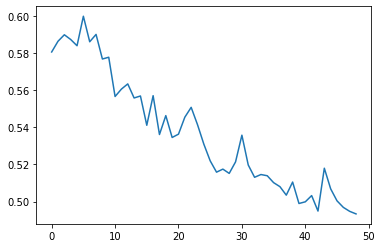

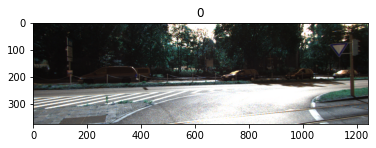

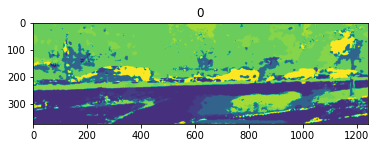

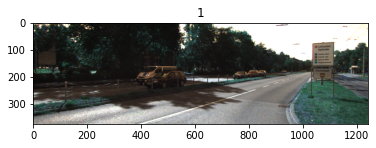

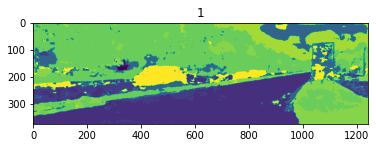

...

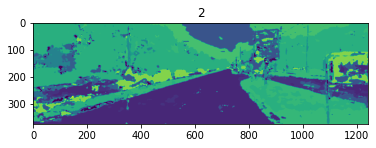

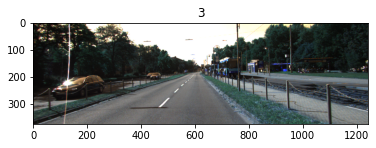

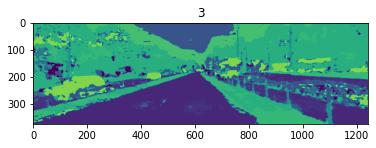

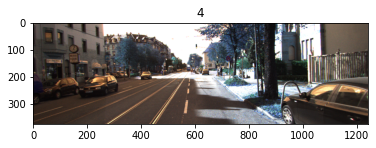

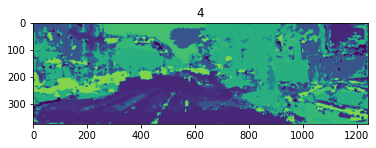

In [43]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")        
dataset = KITTI_SEG(TRAIN_RGB_PATH, TRAIN_SEMANTIC_PATH, device=device)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=0)

TRAINED_MODELS_PATH = os.path.join(DATA_PATH, "trained_models")
trained_model_path = os.path.join(TRAINED_MODELS_PATH, "trained_model99.pth")
model = torch.load(trained_model_path)
model = train(model, dataloader)

inference takes 0.019826650619506836
inference takes 0.019522428512573242
inference takes 0.019523143768310547
inference takes 0.01950669288635254
inference takes 0.01955437660217285
inference takes 0.0195462703704834
inference takes 0.019557714462280273
inference takes 0.01949286460876465
inference takes 0.019557952880859375
inference takes 0.019518375396728516
inference takes 0.0196683406829834


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


inference takes 0.01962590217590332
inference takes 0.019559860229492188
inference takes 0.019566059112548828
inference takes 0.019567251205444336
inference takes 0.019504308700561523
inference takes 0.01952528953552246
inference takes 0.019544124603271484
inference takes 0.01961660385131836
inference takes 0.019537925720214844
inference takes 0.01958441734313965
inference takes 0.019681453704833984
inference takes 0.019559383392333984
inference takes 0.019562721252441406
inference takes 0.019582033157348633
inference takes 0.019562959671020508
inference takes 0.019561767578125
inference takes 0.0195310115814209
inference takes 0.019504785537719727
inference takes 0.01955270767211914


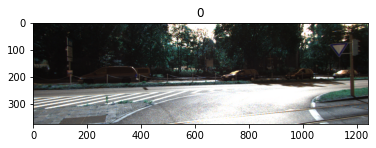

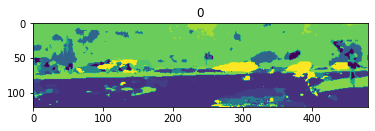

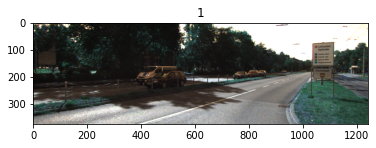

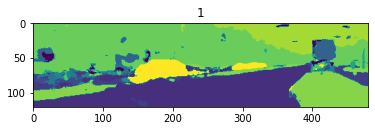

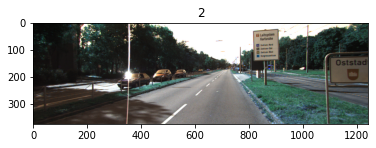

...

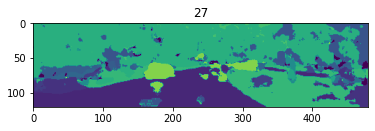

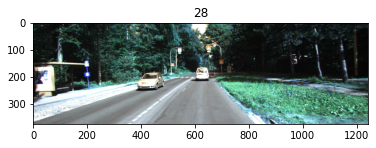

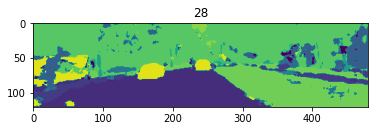

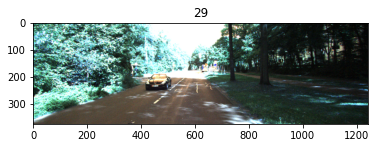

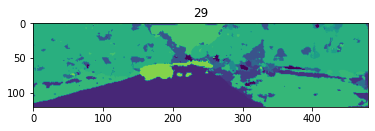

In [50]:
TRAINED_MODELS_PATH = os.path.join(DATA_PATH, "trained_models")
trained_model_path = os.path.join(TRAINED_MODELS_PATH, "trained_model348.pth")
model = torch.load(trained_model_path)
testViz(model, num_example=30)
